## Load Data

In [1]:
!nvidia-smi #py 3.10.11

ERROR: Option #py is not recognized. Please run 'nvidia-smi -h'.



In [2]:
#Count data
import os

# Define the paths to the directories
train_dir = "./../../data/train_augmented/"
test_dir = "./../../data/test/"

categories = [
    "ALGAL_LEAF_SPOT",
    "ALLOCARIDARA_ATTACK",
    "HEALTHY_LEAF",
    "LEAF_BLIGHT",
    "PHOMOPSIS_LEAF_SPOT"
]

print("--- Training Set File Counts ---")
for category in categories:
    dir_path = os.path.join(train_dir, category)
    try:
        count = len(os.listdir(dir_path))
        print(f"Number of files in {dir_path}: {count}")
    except FileNotFoundError:
        print(f"Directory not found: {dir_path}")
    except Exception as e:
        print(f"An error occurred for {dir_path}: {e}")

print("\n--- Test Set File Counts ---")
for category in categories:
    dir_path = os.path.join(test_dir, category)
    try:
        count = len(os.listdir(dir_path))
        print(f"Number of files in {dir_path}: {count}")
    except FileNotFoundError:
        print(f"Directory not found: {dir_path}")
    except Exception as e:
        print(f"An error occurred for {dir_path}: {e}")

--- Training Set File Counts ---
Number of files in ./../../data/train_augmented/ALGAL_LEAF_SPOT: 1896
Number of files in ./../../data/train_augmented/ALLOCARIDARA_ATTACK: 2361
Number of files in ./../../data/train_augmented/HEALTHY_LEAF: 2523
Number of files in ./../../data/train_augmented/LEAF_BLIGHT: 2424
Number of files in ./../../data/train_augmented/PHOMOPSIS_LEAF_SPOT: 2271

--- Test Set File Counts ---
Number of files in ./../../data/test/ALGAL_LEAF_SPOT: 101
Number of files in ./../../data/test/ALLOCARIDARA_ATTACK: 126
Number of files in ./../../data/test/HEALTHY_LEAF: 135
Number of files in ./../../data/test/LEAF_BLIGHT: 129
Number of files in ./../../data/test/PHOMOPSIS_LEAF_SPOT: 121


# Install Timm

In [3]:
import torch
import torch.nn as nn
import torchvision.transforms as T
from torch.utils.data import DataLoader, random_split, Dataset

# Pytorch Image model (TIMM) library: a library for state-of-the-art image classification
import timm
import timm.optim
import timm.scheduler
from timm.data import ImageDataset, create_dataset, create_loader
from timm.data.transforms_factory import create_transform
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from PIL import Image

import evaluate

import numpy as np
import pandas as pd
from scipy import stats

from tqdm.notebook import tqdm

import glob

from sklearn.model_selection import StratifiedKFold,KFold

from lightning.fabric import Fabric

from copy import copy

import shutil
import torchvision.transforms as transforms

from sklearn.utils.class_weight import compute_class_weight
from torchvision import datasets

## visualization Model

In [4]:
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    %pip install -q torchinfo
    from torchinfo import summary

In [5]:
# Select model (List of available is shown above)
res2net50 = "res2net50_26w_4s"
res2net50_model= timm.create_model(res2net50, pretrained=True, num_classes=5)
# Print a summary using torchinfo (uncomment for actual output)
summary(model=res2net50_model,
        input_size=(16, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet (ResNet)                          [16, 3, 224, 224]    [16, 5]              --                   True
├─Conv2d (conv1)                         [16, 3, 224, 224]    [16, 64, 112, 112]   9,408                True
├─BatchNorm2d (bn1)                      [16, 64, 112, 112]   [16, 64, 112, 112]   128                  True
├─ReLU (act1)                            [16, 64, 112, 112]   [16, 64, 112, 112]   --                   --
├─MaxPool2d (maxpool)                    [16, 64, 112, 112]   [16, 64, 56, 56]     --                   --
├─Sequential (layer1)                    [16, 64, 56, 56]     [16, 256, 56, 56]    --                   True
│    └─Bottle2neck (0)                   [16, 64, 56, 56]     [16, 256, 56, 56]    --                   True
│    │    └─Conv2d (conv1)               [16, 64, 56, 56]     [16, 104, 56, 56]    6,656                True
│    │    └─BatchN

In [6]:
# Transform image data based on ImageNet's mean and std
data_transforms = { # เปลี่ยนชื่อตัวแปรเป็น data_transforms
    "train": T.Compose([
        T.Resize((224, 224)),
        T.ToTensor(),
        T.Normalize(mean=torch.tensor([0.4850, 0.4560, 0.4060]), std=torch.tensor([0.2290, 0.2240, 0.2250]))
    ]),
    "test": T.Compose([
        T.Resize((224, 224)),
        T.ToTensor(),
        T.Normalize(mean=torch.tensor([0.4850, 0.4560, 0.4060]), std=torch.tensor([0.2290, 0.2240, 0.2250]))
    ]),
}

In [7]:
dataset = datasets.ImageFolder(root=train_dir,
                               transform=data_transforms["train"],
                               target_transform=None)

In [8]:
dataset.class_to_idx

{'ALGAL_LEAF_SPOT': 0,
 'ALLOCARIDARA_ATTACK': 1,
 'HEALTHY_LEAF': 2,
 'LEAF_BLIGHT': 3,
 'PHOMOPSIS_LEAF_SPOT': 4}

In [9]:
len(dataset)

11475

In [10]:
# Select device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [11]:
#Select Model
model_name = "res2net50_26w_4s"

In [12]:
num_epochs = 5
criterion = nn.CrossEntropyLoss()

# Cross Validation Configuration
k_splits = 5
metric = evaluate.load("accuracy")

In [13]:
# Cross validation
kf = KFold(n_splits=k_splits, shuffle=True, random_state=42)

In [14]:
# Gradient Accumulation Settings
# Set to 1 for no accumulation
train_batch_size = 16
eval_batch_size = 8
num_accumulate = 1

In [15]:
torch.set_float32_matmul_precision('high')
#fabric = Fabric(accelerator="cuda", precision="16-mixed")
fabric = Fabric(accelerator="gpu", devices=1, precision="16-mixed")
fabric.launch()

Using 16-bit Automatic Mixed Precision (AMP)


In [16]:
import time

In [17]:
%%time
all_eval_scores = []

for fold, (train_idx, val_idx) in enumerate(kf.split(dataset)):
    print(f"Fold {fold+1} of {k_splits}")

    # Load Model
    model = timm.create_model(model_name, pretrained=True, num_classes=5)


    # Load Optimizer and Scheduler
    optimizer = timm.optim.create_optimizer_v2(model, opt="AdamW", lr=5e-4)
    # optimizer = timm.optim.Lookahead(optimizer, alpha=0.5, k=6)    # update the slow weight every k steps
                                                                   # update the optimizer by combine slow weight and fast weight * alpha

    model, optimizer = fabric.setup(model, optimizer)

    scheduler = timm.scheduler.create_scheduler_v2(optimizer, num_epochs=num_epochs)[0]

    # Load Data: split train and valition set based on kfold
    train_dataset = torch.utils.data.Subset(dataset, train_idx)
    val_dataset = torch.utils.data.Subset(dataset, val_idx)

    train_dataloader = DataLoader(train_dataset, batch_size=train_batch_size, shuffle=True, num_workers=4, pin_memory=True)
    val_dataloader = DataLoader(val_dataset, batch_size=eval_batch_size, shuffle=False, num_workers=4, pin_memory=True)

    train_dataloader, val_dataloader = fabric.setup_dataloaders(train_dataloader, val_dataloader)

    # Reset Model Info
    info = {
        "metric_train": [],
        "metric_val": [],
        "train_loss": [],
        "val_loss": [],
        "best_metric_val": -999,
        "best_val_loss": 999,
    }

    for epoch in range(num_epochs):
        train_loss_epoch = []
        val_loss_epoch = []

        train_preds = []
        train_targets = []

        val_preds = []
        val_targets = []

        num_updates = epoch * len(train_dataloader)

        ### === Train Loop === ###
        ## Time
        s1 = time.time()

        model.train()
        for idx, batch in enumerate(tqdm(train_dataloader)):
            inputs, targets = batch
            # inputs = {k: v.to(device) for k,v in inputs.items()}
            outputs = model(inputs)
            loss = criterion(outputs, targets)

            fabric.backward(loss)

            # === Gradient Accumulation === #
            if ((idx + 1) % num_accumulate == 0) or (idx + 1 == len(train_dataloader)):
                optimizer.step()
                scheduler.step_update(num_updates=num_updates)
                optimizer.zero_grad()
            # ============================= #

            train_loss_epoch.append(loss.item())
            train_preds += outputs.argmax(-1).detach().cpu().tolist()
            train_targets += targets.tolist()
        ### ==================== ###

        # optimizer.sync_lookahead()              # Sync slow weight and fast weight
        scheduler.step(epoch + 1)

        ### === Evaluation Loop === ###
        model.eval()
        with torch.no_grad():
            for batch in tqdm(val_dataloader):
                inputs, targets = batch
                # inputs = {k: v.to(device) for k,v in inputs.items()}
                outputs = model(inputs)
                loss = criterion(outputs, targets)

                # Log Values
                val_loss_epoch.append(loss.item())
                val_preds += outputs.argmax(-1).detach().cpu().tolist()
                val_targets += targets.tolist()
        ### ======================= ###
        ## Time train finish
        s2 = time.time()
        elapsed_time = s2 - s1


        # Log Data
        metric_train = metric.compute(predictions=train_preds, references=train_targets)["accuracy"]
        metric_val = metric.compute(predictions=val_preds, references=val_targets)["accuracy"]

        info["metric_train"].append(metric_train)
        info["metric_val"].append(metric_val)

        info["train_loss"].append(np.average(train_loss_epoch))
        info["val_loss"].append(np.average(val_loss_epoch))

        if metric_val > info["best_metric_val"]:
        # if info["val_loss"][-1] < info["best_val_loss"]:
            print("New Best Score!")
            # print("New Best Val Loss")
            info["best_metric_val"] = metric_val
            # info["best_val_loss"] = info["val_loss"][-1]
            torch.save(model, f"res2net50_checkpoint_fold{fold}.pt")

        print(f"Using time of Fold: {fold} | Epoch: {epoch} | {elapsed_time} second ")
        print(info)
        print(f"Fold: {fold} | Epoch: {epoch} | Metric: {metric_val} | Training Loss: {np.average(train_loss_epoch)} | Validation Loss: {np.average(val_loss_epoch)}")

    # save all best metric val
    all_eval_scores.append(info["best_metric_val"])

Fold 1 of 5


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 0 | 114.73291301727295 second 
{'metric_train': [0.7210239651416122], 'metric_val': [0.8108932461873638], 'train_loss': [np.float64(0.7748011596994118)], 'val_loss': [np.float64(0.5173379722009137)], 'best_metric_val': 0.8108932461873638, 'best_val_loss': 999}
Fold: 0 | Epoch: 0 | Metric: 0.8108932461873638 | Training Loss: 0.7748011596994118 | Validation Loss: 0.5173379722009137


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 1 | 105.78718328475952 second 
{'metric_train': [0.7210239651416122, 0.8361655773420479], 'metric_val': [0.8108932461873638, 0.8474945533769063], 'train_loss': [np.float64(0.7748011596994118), np.float64(0.4647681430462449)], 'val_loss': [np.float64(0.5173379722009137), np.float64(0.4800369762986913)], 'best_metric_val': 0.8474945533769063, 'best_val_loss': 999}
Fold: 0 | Epoch: 1 | Metric: 0.8474945533769063 | Training Loss: 0.4647681430462449 | Validation Loss: 0.4800369762986913


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 2 | 118.45670080184937 second 
{'metric_train': [0.7210239651416122, 0.8361655773420479, 0.894880174291939], 'metric_val': [0.8108932461873638, 0.8474945533769063, 0.8997821350762527], 'train_loss': [np.float64(0.7748011596994118), np.float64(0.4647681430462449), np.float64(0.3027662934057207)], 'val_loss': [np.float64(0.5173379722009137), np.float64(0.4800369762986913), np.float64(0.24840516603602458)], 'best_metric_val': 0.8997821350762527, 'best_val_loss': 999}
Fold: 0 | Epoch: 2 | Metric: 0.8997821350762527 | Training Loss: 0.3027662934057207 | Validation Loss: 0.24840516603602458


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 3 | 110.94493436813354 second 
{'metric_train': [0.7210239651416122, 0.8361655773420479, 0.894880174291939, 0.9401960784313725], 'metric_val': [0.8108932461873638, 0.8474945533769063, 0.8997821350762527, 0.9228758169934641], 'train_loss': [np.float64(0.7748011596994118), np.float64(0.4647681430462449), np.float64(0.3027662934057207), np.float64(0.17212627221950255)], 'val_loss': [np.float64(0.5173379722009137), np.float64(0.4800369762986913), np.float64(0.24840516603602458), np.float64(0.21362257739710533)], 'best_metric_val': 0.9228758169934641, 'best_val_loss': 999}
Fold: 0 | Epoch: 3 | Metric: 0.9228758169934641 | Training Loss: 0.17212627221950255 | Validation Loss: 0.21362257739710533


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 4 | 122.14031147956848 second 
{'metric_train': [0.7210239651416122, 0.8361655773420479, 0.894880174291939, 0.9401960784313725, 0.9755991285403051], 'metric_val': [0.8108932461873638, 0.8474945533769063, 0.8997821350762527, 0.9228758169934641, 0.9442265795206972], 'train_loss': [np.float64(0.7748011596994118), np.float64(0.4647681430462449), np.float64(0.3027662934057207), np.float64(0.17212627221950255), np.float64(0.07950761849210737)], 'val_loss': [np.float64(0.5173379722009137), np.float64(0.4800369762986913), np.float64(0.24840516603602458), np.float64(0.21362257739710533), np.float64(0.1763044777403862)], 'best_metric_val': 0.9442265795206972, 'best_val_loss': 999}
Fold: 0 | Epoch: 4 | Metric: 0.9442265795206972 | Training Loss: 0.07950761849210737 | Validation Loss: 0.1763044777403862
Fold 2 of 5


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 0 | 122.11930584907532 second 
{'metric_train': [0.7164488017429194], 'metric_val': [0.7446623093681917], 'train_loss': [np.float64(0.7676262385390361)], 'val_loss': [np.float64(0.7459476042558352)], 'best_metric_val': 0.7446623093681917, 'best_val_loss': 999}
Fold: 1 | Epoch: 0 | Metric: 0.7446623093681917 | Training Loss: 0.7676262385390361 | Validation Loss: 0.7459476042558352


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 1 | 111.9963927268982 second 
{'metric_train': [0.7164488017429194, 0.8364923747276688], 'metric_val': [0.7446623093681917, 0.8636165577342048], 'train_loss': [np.float64(0.7676262385390361), np.float64(0.47158470477272824)], 'val_loss': [np.float64(0.7459476042558352), np.float64(0.37266936520689165)], 'best_metric_val': 0.8636165577342048, 'best_val_loss': 999}
Fold: 1 | Epoch: 1 | Metric: 0.8636165577342048 | Training Loss: 0.47158470477272824 | Validation Loss: 0.37266936520689165


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 2 | 109.43162059783936 second 
{'metric_train': [0.7164488017429194, 0.8364923747276688, 0.8997821350762527], 'metric_val': [0.7446623093681917, 0.8636165577342048, 0.8945533769063181], 'train_loss': [np.float64(0.7676262385390361), np.float64(0.47158470477272824), np.float64(0.29923863490582653)], 'val_loss': [np.float64(0.7459476042558352), np.float64(0.37266936520689165), np.float64(0.2837408442395738)], 'best_metric_val': 0.8945533769063181, 'best_val_loss': 999}
Fold: 1 | Epoch: 2 | Metric: 0.8945533769063181 | Training Loss: 0.29923863490582653 | Validation Loss: 0.2837408442395738


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 3 | 109.51600980758667 second 
{'metric_train': [0.7164488017429194, 0.8364923747276688, 0.8997821350762527, 0.9466230936819172], 'metric_val': [0.7446623093681917, 0.8636165577342048, 0.8945533769063181, 0.9233115468409586], 'train_loss': [np.float64(0.7676262385390361), np.float64(0.47158470477272824), np.float64(0.29923863490582653), np.float64(0.15104102965392405)], 'val_loss': [np.float64(0.7459476042558352), np.float64(0.37266936520689165), np.float64(0.2837408442395738), np.float64(0.23232742678941298)], 'best_metric_val': 0.9233115468409586, 'best_val_loss': 999}
Fold: 1 | Epoch: 3 | Metric: 0.9233115468409586 | Training Loss: 0.15104102965392405 | Validation Loss: 0.23232742678941298


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 4 | 109.2174506187439 second 
{'metric_train': [0.7164488017429194, 0.8364923747276688, 0.8997821350762527, 0.9466230936819172, 0.9781045751633987], 'metric_val': [0.7446623093681917, 0.8636165577342048, 0.8945533769063181, 0.9233115468409586, 0.9372549019607843], 'train_loss': [np.float64(0.7676262385390361), np.float64(0.47158470477272824), np.float64(0.29923863490582653), np.float64(0.15104102965392405), np.float64(0.07431392591363079)], 'val_loss': [np.float64(0.7459476042558352), np.float64(0.37266936520689165), np.float64(0.2837408442395738), np.float64(0.23232742678941298), np.float64(0.17894922741365615)], 'best_metric_val': 0.9372549019607843, 'best_val_loss': 999}
Fold: 1 | Epoch: 4 | Metric: 0.9372549019607843 | Training Loss: 0.07431392591363079 | Validation Loss: 0.17894922741365615
Fold 3 of 5


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 0 | 112.40712428092957 second 
{'metric_train': [0.7328976034858388], 'metric_val': [0.8135076252723311], 'train_loss': [np.float64(0.7433598034784769)], 'val_loss': [np.float64(0.531062584807642)], 'best_metric_val': 0.8135076252723311, 'best_val_loss': 999}
Fold: 2 | Epoch: 0 | Metric: 0.8135076252723311 | Training Loss: 0.7433598034784769 | Validation Loss: 0.531062584807642


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 1 | 109.61895871162415 second 
{'metric_train': [0.7328976034858388, 0.8495642701525055], 'metric_val': [0.8135076252723311, 0.820479302832244], 'train_loss': [np.float64(0.7433598034784769), np.float64(0.4466015735790393)], 'val_loss': [np.float64(0.531062584807642), np.float64(0.48247219503083255)], 'best_metric_val': 0.820479302832244, 'best_val_loss': 999}
Fold: 2 | Epoch: 1 | Metric: 0.820479302832244 | Training Loss: 0.4466015735790393 | Validation Loss: 0.48247219503083255


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 2 | 109.7873067855835 second 
{'metric_train': [0.7328976034858388, 0.8495642701525055, 0.9033769063180828], 'metric_val': [0.8135076252723311, 0.820479302832244, 0.889760348583878], 'train_loss': [np.float64(0.7433598034784769), np.float64(0.4466015735790393), np.float64(0.28387682810944964)], 'val_loss': [np.float64(0.531062584807642), np.float64(0.48247219503083255), np.float64(0.2942248747758418)], 'best_metric_val': 0.889760348583878, 'best_val_loss': 999}
Fold: 2 | Epoch: 2 | Metric: 0.889760348583878 | Training Loss: 0.28387682810944964 | Validation Loss: 0.2942248747758418


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 3 | 113.4488136768341 second 
{'metric_train': [0.7328976034858388, 0.8495642701525055, 0.9033769063180828, 0.9467320261437908], 'metric_val': [0.8135076252723311, 0.820479302832244, 0.889760348583878, 0.9302832244008714], 'train_loss': [np.float64(0.7433598034784769), np.float64(0.4466015735790393), np.float64(0.28387682810944964), np.float64(0.1561016031445202)], 'val_loss': [np.float64(0.531062584807642), np.float64(0.48247219503083255), np.float64(0.2942248747758418), np.float64(0.18119184346443679)], 'best_metric_val': 0.9302832244008714, 'best_val_loss': 999}
Fold: 2 | Epoch: 3 | Metric: 0.9302832244008714 | Training Loss: 0.1561016031445202 | Validation Loss: 0.18119184346443679


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 4 | 119.41970610618591 second 
{'metric_train': [0.7328976034858388, 0.8495642701525055, 0.9033769063180828, 0.9467320261437908, 0.9796296296296296], 'metric_val': [0.8135076252723311, 0.820479302832244, 0.889760348583878, 0.9302832244008714, 0.9464052287581699], 'train_loss': [np.float64(0.7433598034784769), np.float64(0.4466015735790393), np.float64(0.28387682810944964), np.float64(0.1561016031445202), np.float64(0.06182865816158752)], 'val_loss': [np.float64(0.531062584807642), np.float64(0.48247219503083255), np.float64(0.2942248747758418), np.float64(0.18119184346443679), np.float64(0.15608550554321096)], 'best_metric_val': 0.9464052287581699, 'best_val_loss': 999}
Fold: 2 | Epoch: 4 | Metric: 0.9464052287581699 | Training Loss: 0.06182865816158752 | Validation Loss: 0.15608550554321096
Fold 4 of 5


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 0 | 113.16697454452515 second 
{'metric_train': [0.7149237472766885], 'metric_val': [0.8139433551198257], 'train_loss': [np.float64(0.7841777844607623)], 'val_loss': [np.float64(0.5504866022690551)], 'best_metric_val': 0.8139433551198257, 'best_val_loss': 999}
Fold: 3 | Epoch: 0 | Metric: 0.8139433551198257 | Training Loss: 0.7841777844607623 | Validation Loss: 0.5504866022690551


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 1 | 109.79375839233398 second 
{'metric_train': [0.7149237472766885, 0.8333333333333334], 'metric_val': [0.8139433551198257, 0.8771241830065359], 'train_loss': [np.float64(0.7841777844607623), np.float64(0.4645564232268192)], 'val_loss': [np.float64(0.5504866022690551), np.float64(0.33814068364777733)], 'best_metric_val': 0.8771241830065359, 'best_val_loss': 999}
Fold: 3 | Epoch: 1 | Metric: 0.8771241830065359 | Training Loss: 0.4645564232268192 | Validation Loss: 0.33814068364777733


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 2 | 108.81483054161072 second 
{'metric_train': [0.7149237472766885, 0.8333333333333334, 0.8888888888888888], 'metric_val': [0.8139433551198257, 0.8771241830065359, 0.8997821350762527], 'train_loss': [np.float64(0.7841777844607623), np.float64(0.4645564232268192), np.float64(0.3155397511596827)], 'val_loss': [np.float64(0.5504866022690551), np.float64(0.33814068364777733), np.float64(0.279949475600741)], 'best_metric_val': 0.8997821350762527, 'best_val_loss': 999}
Fold: 3 | Epoch: 2 | Metric: 0.8997821350762527 | Training Loss: 0.3155397511596827 | Validation Loss: 0.279949475600741


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 3 | 109.5012800693512 second 
{'metric_train': [0.7149237472766885, 0.8333333333333334, 0.8888888888888888, 0.9412854030501089], 'metric_val': [0.8139433551198257, 0.8771241830065359, 0.8997821350762527, 0.9320261437908497], 'train_loss': [np.float64(0.7841777844607623), np.float64(0.4645564232268192), np.float64(0.3155397511596827), np.float64(0.16856811705162222)], 'val_loss': [np.float64(0.5504866022690551), np.float64(0.33814068364777733), np.float64(0.279949475600741), np.float64(0.18987289660161835)], 'best_metric_val': 0.9320261437908497, 'best_val_loss': 999}
Fold: 3 | Epoch: 3 | Metric: 0.9320261437908497 | Training Loss: 0.16856811705162222 | Validation Loss: 0.18987289660161835


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 4 | 109.02655959129333 second 
{'metric_train': [0.7149237472766885, 0.8333333333333334, 0.8888888888888888, 0.9412854030501089, 0.9758169934640523], 'metric_val': [0.8139433551198257, 0.8771241830065359, 0.8997821350762527, 0.9320261437908497, 0.9477124183006536], 'train_loss': [np.float64(0.7841777844607623), np.float64(0.4645564232268192), np.float64(0.3155397511596827), np.float64(0.16856811705162222), np.float64(0.07309588780610429)], 'val_loss': [np.float64(0.5504866022690551), np.float64(0.33814068364777733), np.float64(0.279949475600741), np.float64(0.18987289660161835), np.float64(0.1530665093250021)], 'best_metric_val': 0.9477124183006536, 'best_val_loss': 999}
Fold: 3 | Epoch: 4 | Metric: 0.9477124183006536 | Training Loss: 0.07309588780610429 | Validation Loss: 0.1530665093250021
Fold 5 of 5


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 0 | 109.86811900138855 second 
{'metric_train': [0.7023965141612201], 'metric_val': [0.824400871459695], 'train_loss': [np.float64(0.8119465339059199)], 'val_loss': [np.float64(0.4758958609090008)], 'best_metric_val': 0.824400871459695, 'best_val_loss': 999}
Fold: 4 | Epoch: 0 | Metric: 0.824400871459695 | Training Loss: 0.8119465339059199 | Validation Loss: 0.4758958609090008


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 1 | 119.8599705696106 second 
{'metric_train': [0.7023965141612201, 0.8288671023965142], 'metric_val': [0.824400871459695, 0.8405228758169935], 'train_loss': [np.float64(0.8119465339059199), np.float64(0.48087189228432936)], 'val_loss': [np.float64(0.4758958609090008), np.float64(0.41792789182716167)], 'best_metric_val': 0.8405228758169935, 'best_val_loss': 999}
Fold: 4 | Epoch: 1 | Metric: 0.8405228758169935 | Training Loss: 0.48087189228432936 | Validation Loss: 0.41792789182716167


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 2 | 117.81168746948242 second 
{'metric_train': [0.7023965141612201, 0.8288671023965142, 0.8889978213507626], 'metric_val': [0.824400871459695, 0.8405228758169935, 0.8971677559912854], 'train_loss': [np.float64(0.8119465339059199), np.float64(0.48087189228432936), np.float64(0.32032489337234754)], 'val_loss': [np.float64(0.4758958609090008), np.float64(0.41792789182716167), np.float64(0.2719446935784665)], 'best_metric_val': 0.8971677559912854, 'best_val_loss': 999}
Fold: 4 | Epoch: 2 | Metric: 0.8971677559912854 | Training Loss: 0.32032489337234754 | Validation Loss: 0.2719446935784665


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 3 | 105.80795097351074 second 
{'metric_train': [0.7023965141612201, 0.8288671023965142, 0.8889978213507626, 0.9466230936819172], 'metric_val': [0.824400871459695, 0.8405228758169935, 0.8971677559912854, 0.9198257080610022], 'train_loss': [np.float64(0.8119465339059199), np.float64(0.48087189228432936), np.float64(0.32032489337234754), np.float64(0.16093297058291317)], 'val_loss': [np.float64(0.4758958609090008), np.float64(0.41792789182716167), np.float64(0.2719446935784665), np.float64(0.21321369595728576)], 'best_metric_val': 0.9198257080610022, 'best_val_loss': 999}
Fold: 4 | Epoch: 3 | Metric: 0.9198257080610022 | Training Loss: 0.16093297058291317 | Validation Loss: 0.21321369595728576


  0%|          | 0/574 [00:00<?, ?it/s]

  0%|          | 0/287 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 4 | 106.1857099533081 second 
{'metric_train': [0.7023965141612201, 0.8288671023965142, 0.8889978213507626, 0.9466230936819172, 0.9758169934640523], 'metric_val': [0.824400871459695, 0.8405228758169935, 0.8971677559912854, 0.9198257080610022, 0.9389978213507625], 'train_loss': [np.float64(0.8119465339059199), np.float64(0.48087189228432936), np.float64(0.32032489337234754), np.float64(0.16093297058291317), np.float64(0.07403646289080525)], 'val_loss': [np.float64(0.4758958609090008), np.float64(0.41792789182716167), np.float64(0.2719446935784665), np.float64(0.21321369595728576), np.float64(0.18089666755438802)], 'best_metric_val': 0.9389978213507625, 'best_val_loss': 999}
Fold: 4 | Epoch: 4 | Metric: 0.9389978213507625 | Training Loss: 0.07403646289080525 | Validation Loss: 0.18089666755438802
CPU times: total: 11min 17s
Wall time: 47min


In [18]:
classname = dataset.classes
classname

['ALGAL_LEAF_SPOT',
 'ALLOCARIDARA_ATTACK',
 'HEALTHY_LEAF',
 'LEAF_BLIGHT',
 'PHOMOPSIS_LEAF_SPOT']

Evaluating Fold 0:   0%|          | 0/287 [00:00<?, ?it/s]


--- Results for Fold: 0 ---


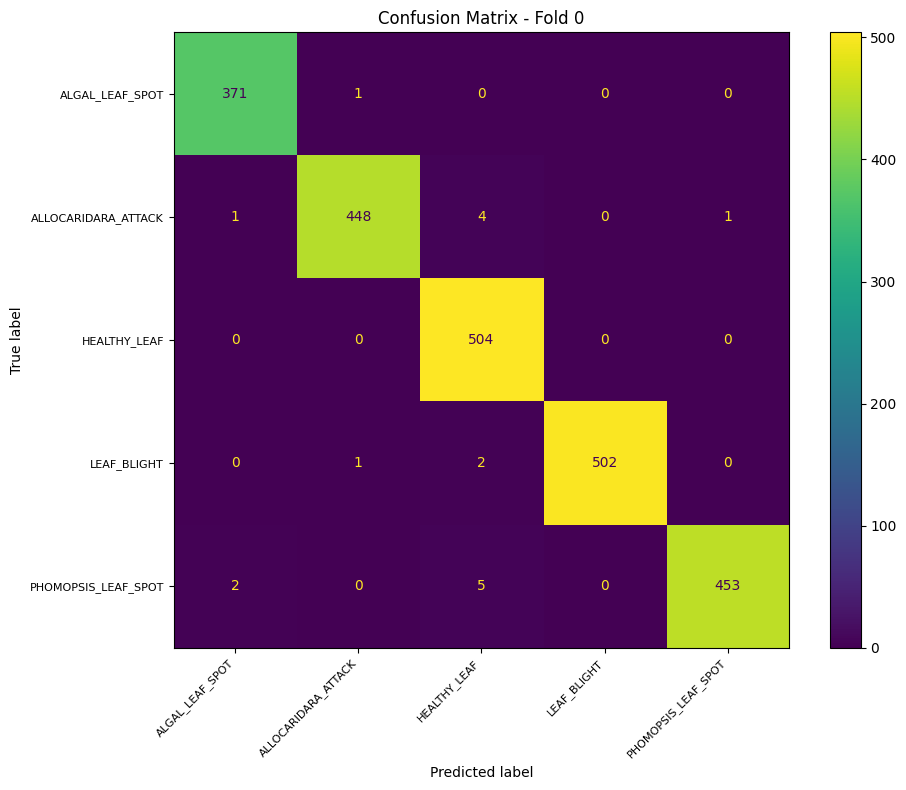

                     precision    recall  f1-score   support

    ALGAL_LEAF_SPOT       0.99      1.00      0.99       372
ALLOCARIDARA_ATTACK       1.00      0.99      0.99       454
       HEALTHY_LEAF       0.98      1.00      0.99       504
        LEAF_BLIGHT       1.00      0.99      1.00       505
PHOMOPSIS_LEAF_SPOT       1.00      0.98      0.99       460

           accuracy                           0.99      2295
          macro avg       0.99      0.99      0.99      2295
       weighted avg       0.99      0.99      0.99      2295

--------------------------------------------------


Evaluating Fold 1:   0%|          | 0/287 [00:00<?, ?it/s]


--- Results for Fold: 1 ---


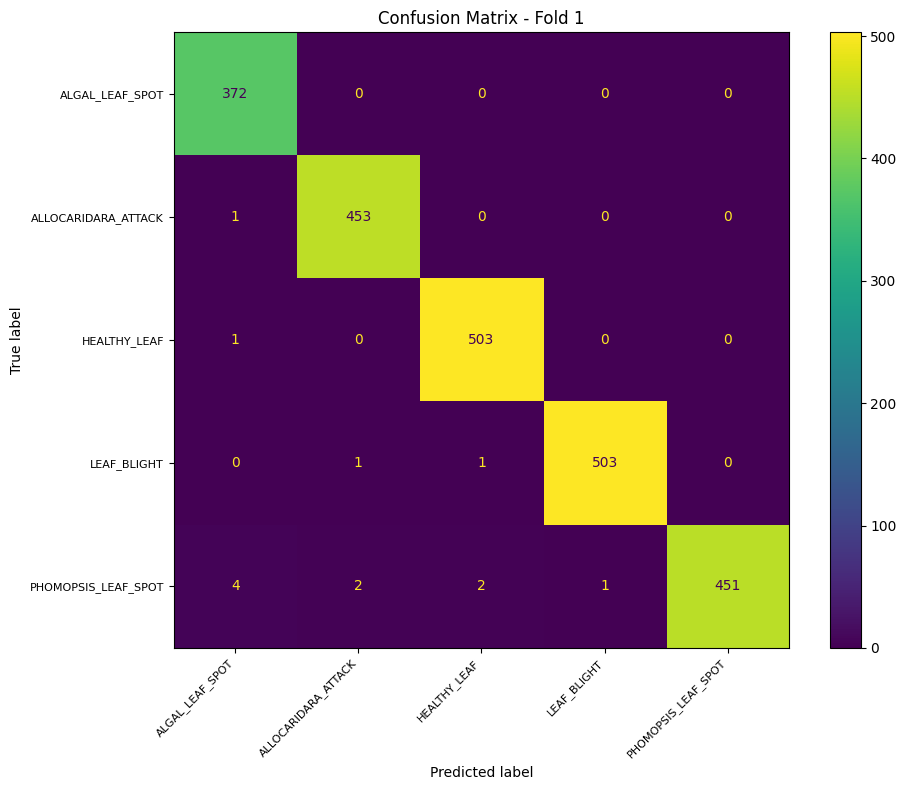

                     precision    recall  f1-score   support

    ALGAL_LEAF_SPOT       0.98      1.00      0.99       372
ALLOCARIDARA_ATTACK       0.99      1.00      1.00       454
       HEALTHY_LEAF       0.99      1.00      1.00       504
        LEAF_BLIGHT       1.00      1.00      1.00       505
PHOMOPSIS_LEAF_SPOT       1.00      0.98      0.99       460

           accuracy                           0.99      2295
          macro avg       0.99      0.99      0.99      2295
       weighted avg       0.99      0.99      0.99      2295

--------------------------------------------------


Evaluating Fold 2:   0%|          | 0/287 [00:00<?, ?it/s]


--- Results for Fold: 2 ---


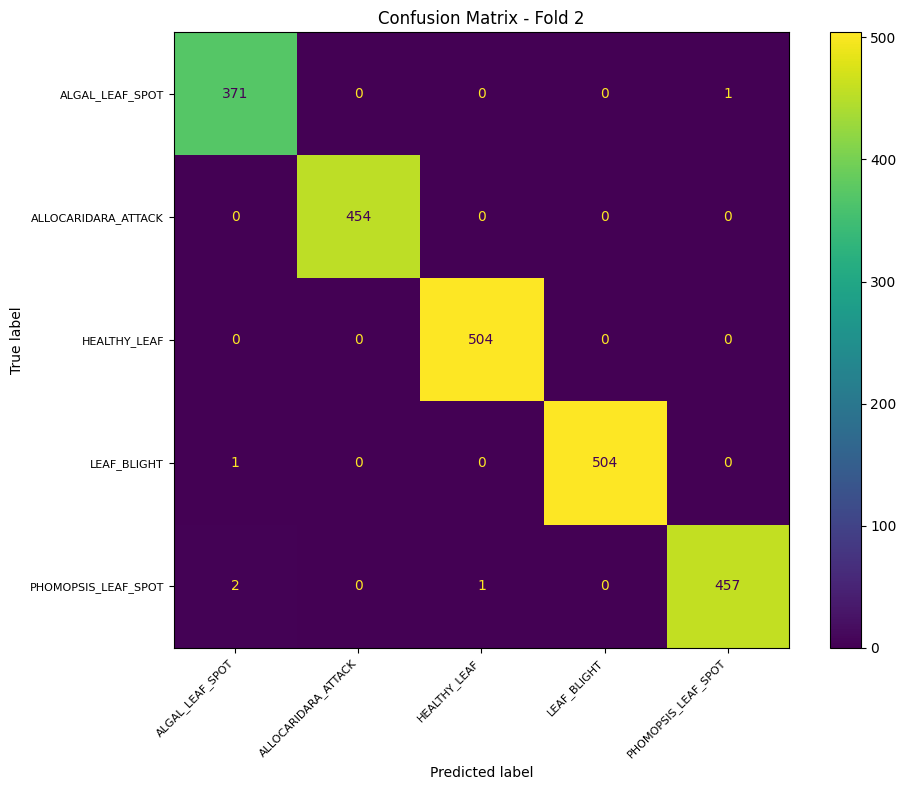

                     precision    recall  f1-score   support

    ALGAL_LEAF_SPOT       0.99      1.00      0.99       372
ALLOCARIDARA_ATTACK       1.00      1.00      1.00       454
       HEALTHY_LEAF       1.00      1.00      1.00       504
        LEAF_BLIGHT       1.00      1.00      1.00       505
PHOMOPSIS_LEAF_SPOT       1.00      0.99      1.00       460

           accuracy                           1.00      2295
          macro avg       1.00      1.00      1.00      2295
       weighted avg       1.00      1.00      1.00      2295

--------------------------------------------------


Evaluating Fold 3:   0%|          | 0/287 [00:00<?, ?it/s]


--- Results for Fold: 3 ---


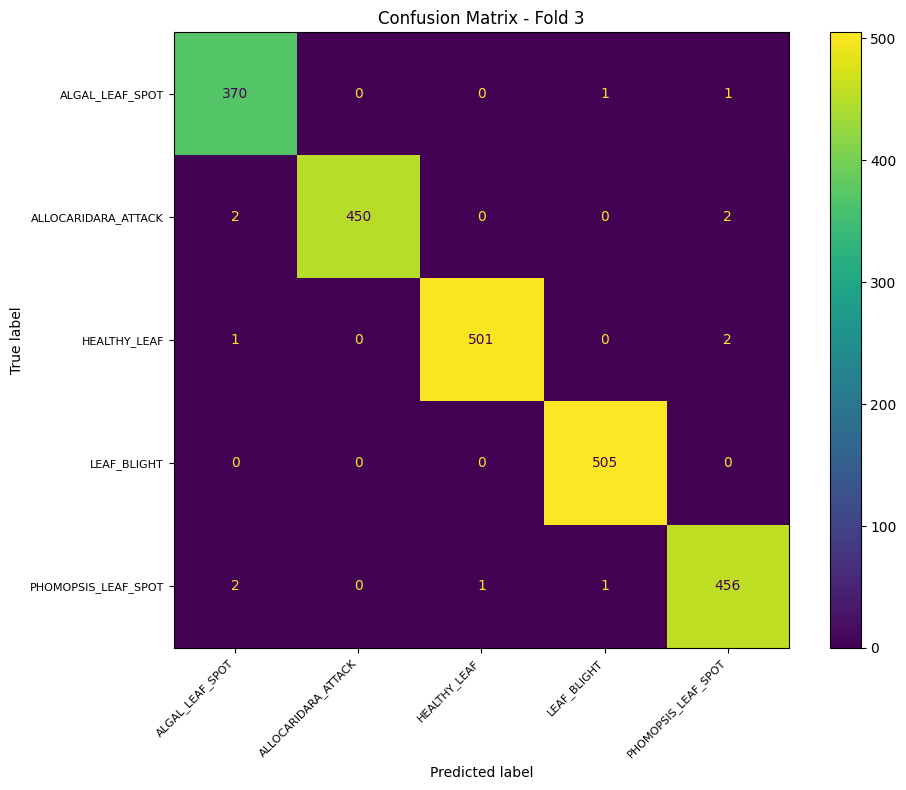

                     precision    recall  f1-score   support

    ALGAL_LEAF_SPOT       0.99      0.99      0.99       372
ALLOCARIDARA_ATTACK       1.00      0.99      1.00       454
       HEALTHY_LEAF       1.00      0.99      1.00       504
        LEAF_BLIGHT       1.00      1.00      1.00       505
PHOMOPSIS_LEAF_SPOT       0.99      0.99      0.99       460

           accuracy                           0.99      2295
          macro avg       0.99      0.99      0.99      2295
       weighted avg       0.99      0.99      0.99      2295

--------------------------------------------------


Evaluating Fold 4:   0%|          | 0/287 [00:00<?, ?it/s]


--- Results for Fold: 4 ---


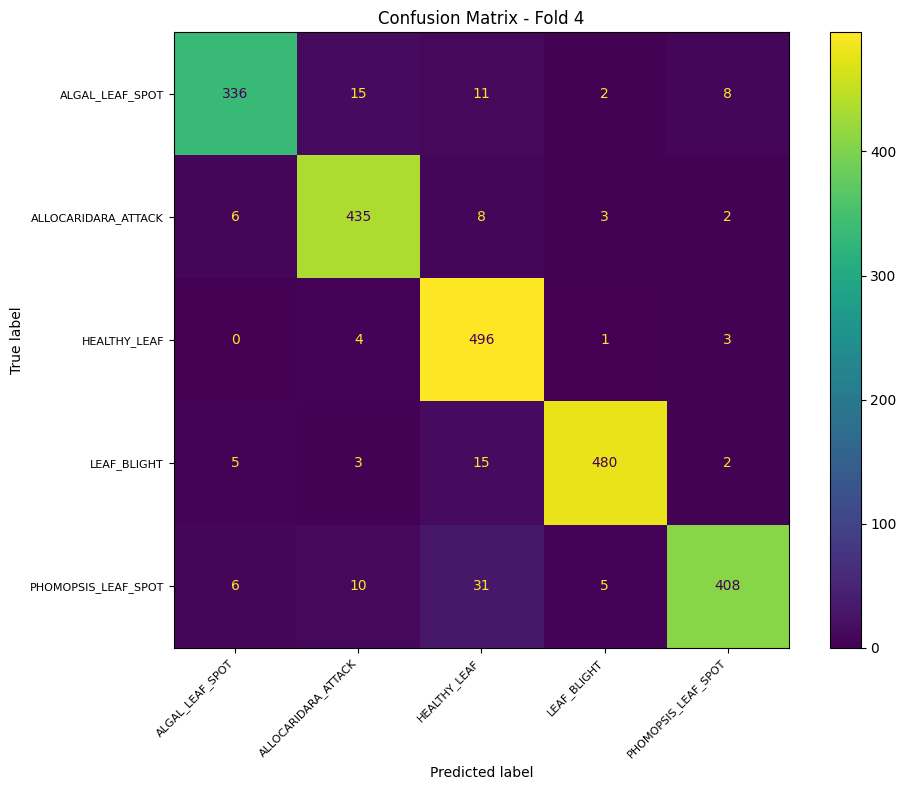

                     precision    recall  f1-score   support

    ALGAL_LEAF_SPOT       0.95      0.90      0.93       372
ALLOCARIDARA_ATTACK       0.93      0.96      0.94       454
       HEALTHY_LEAF       0.88      0.98      0.93       504
        LEAF_BLIGHT       0.98      0.95      0.96       505
PHOMOPSIS_LEAF_SPOT       0.96      0.89      0.92       460

           accuracy                           0.94      2295
          macro avg       0.94      0.94      0.94      2295
       weighted avg       0.94      0.94      0.94      2295

--------------------------------------------------


In [19]:
for fold in range(k_splits):
    predictions = []
    references = []

    loaded_model = torch.load(f"res2net50_checkpoint_fold{fold}.pt", weights_only=False)
    loaded_model.eval()
    with torch.no_grad():
        for batch in tqdm(val_dataloader, desc=f"Evaluating Fold {fold}"):
            inputs, targets = batch
            outputs = loaded_model(inputs.to(device))

            predictions += outputs.argmax(-1).detach().cpu().tolist()
            references += targets.tolist()

    print(f"\n--- Results for Fold: {fold} ---")

    cm = confusion_matrix(references, predictions)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classname)

    fig, ax = plt.subplots(figsize=(10, 8))
    disp.plot(ax=ax)

    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=8)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=8)

    plt.title(f"Confusion Matrix - Fold {fold}")
    plt.tight_layout()
    plt.show()

    print(classification_report(references, predictions, target_names=classname))
    print("-" * 50) #

In [20]:
classname = dataset.classes
classname

['ALGAL_LEAF_SPOT',
 'ALLOCARIDARA_ATTACK',
 'HEALTHY_LEAF',
 'LEAF_BLIGHT',
 'PHOMOPSIS_LEAF_SPOT']

In [21]:
# Making Dataset
test_dataset = datasets.ImageFolder(root=test_dir,
                               transform=data_transforms["test"], # ใช้ data_transforms แทน
                               target_transform=None)# transforms to perform on labels (if necessary)

In [22]:
len(test_dataset)

612

In [23]:
# Making test dataloader
test_dataloader = DataLoader(test_dataset, batch_size=eval_batch_size, shuffle=False, num_workers=4, pin_memory=True)

In [24]:
test_dataset.classes

['ALGAL_LEAF_SPOT',
 'ALLOCARIDARA_ATTACK',
 'HEALTHY_LEAF',
 'LEAF_BLIGHT',
 'PHOMOPSIS_LEAF_SPOT']

In [25]:
len(test_dataloader)

77

Evaluating Fold 0:   0%|          | 0/77 [00:00<?, ?it/s]


--- Results for Fold: 0 ---


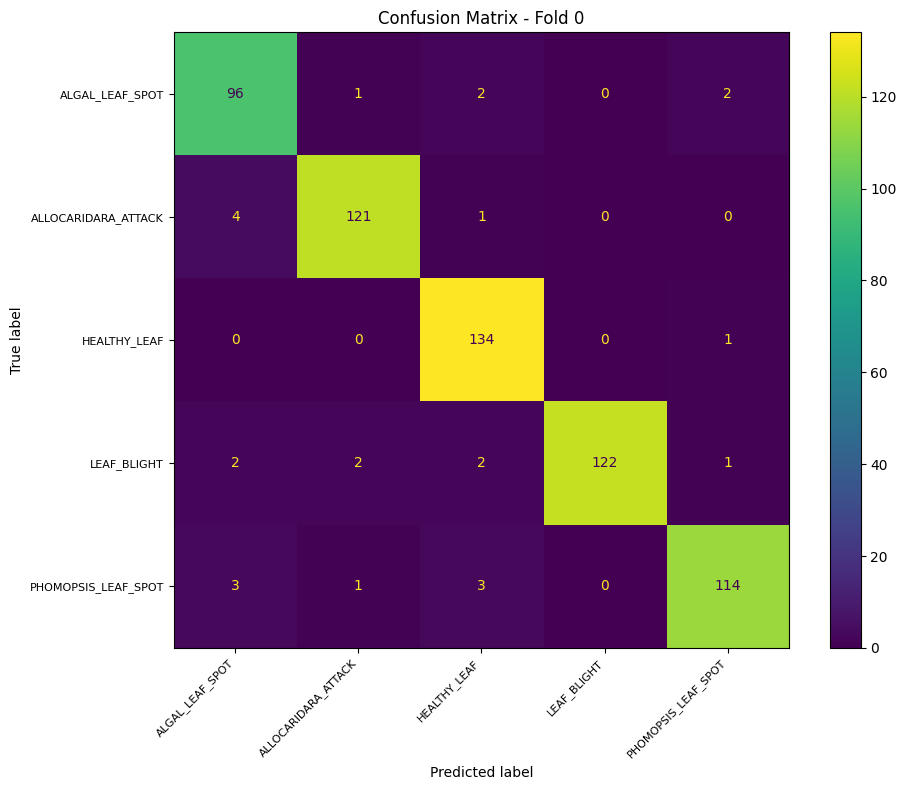

                     precision    recall  f1-score   support

    ALGAL_LEAF_SPOT       0.91      0.95      0.93       101
ALLOCARIDARA_ATTACK       0.97      0.96      0.96       126
       HEALTHY_LEAF       0.94      0.99      0.97       135
        LEAF_BLIGHT       1.00      0.95      0.97       129
PHOMOPSIS_LEAF_SPOT       0.97      0.94      0.95       121

           accuracy                           0.96       612
          macro avg       0.96      0.96      0.96       612
       weighted avg       0.96      0.96      0.96       612

--------------------------------------------------


Evaluating Fold 1:   0%|          | 0/77 [00:00<?, ?it/s]


--- Results for Fold: 1 ---


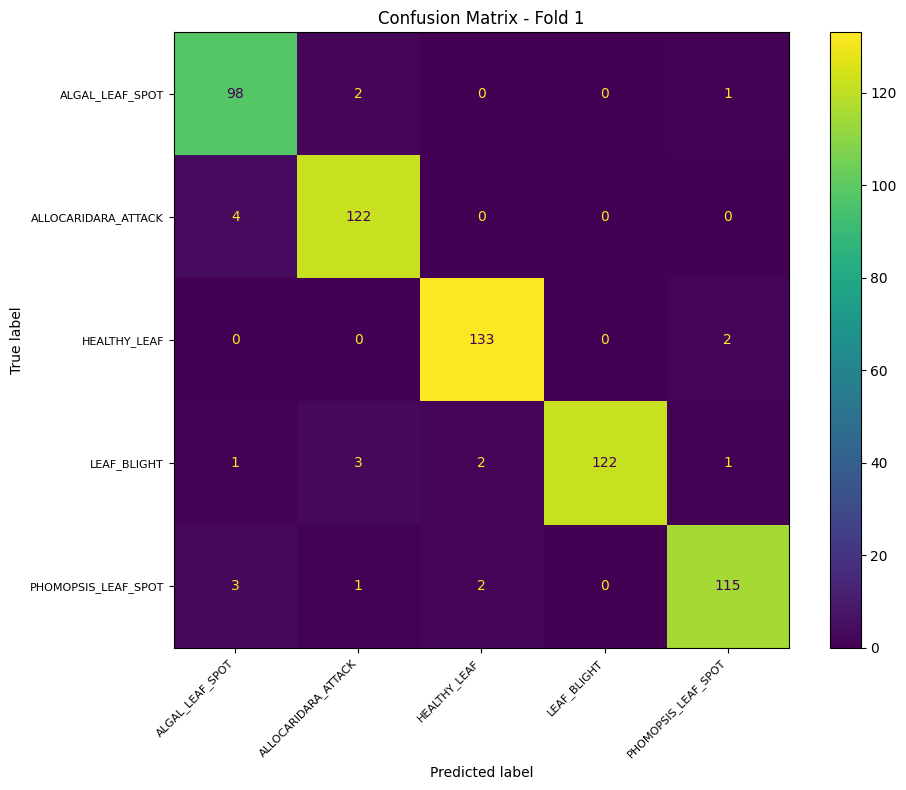

                     precision    recall  f1-score   support

    ALGAL_LEAF_SPOT       0.92      0.97      0.95       101
ALLOCARIDARA_ATTACK       0.95      0.97      0.96       126
       HEALTHY_LEAF       0.97      0.99      0.98       135
        LEAF_BLIGHT       1.00      0.95      0.97       129
PHOMOPSIS_LEAF_SPOT       0.97      0.95      0.96       121

           accuracy                           0.96       612
          macro avg       0.96      0.96      0.96       612
       weighted avg       0.96      0.96      0.96       612

--------------------------------------------------


Evaluating Fold 2:   0%|          | 0/77 [00:00<?, ?it/s]


--- Results for Fold: 2 ---


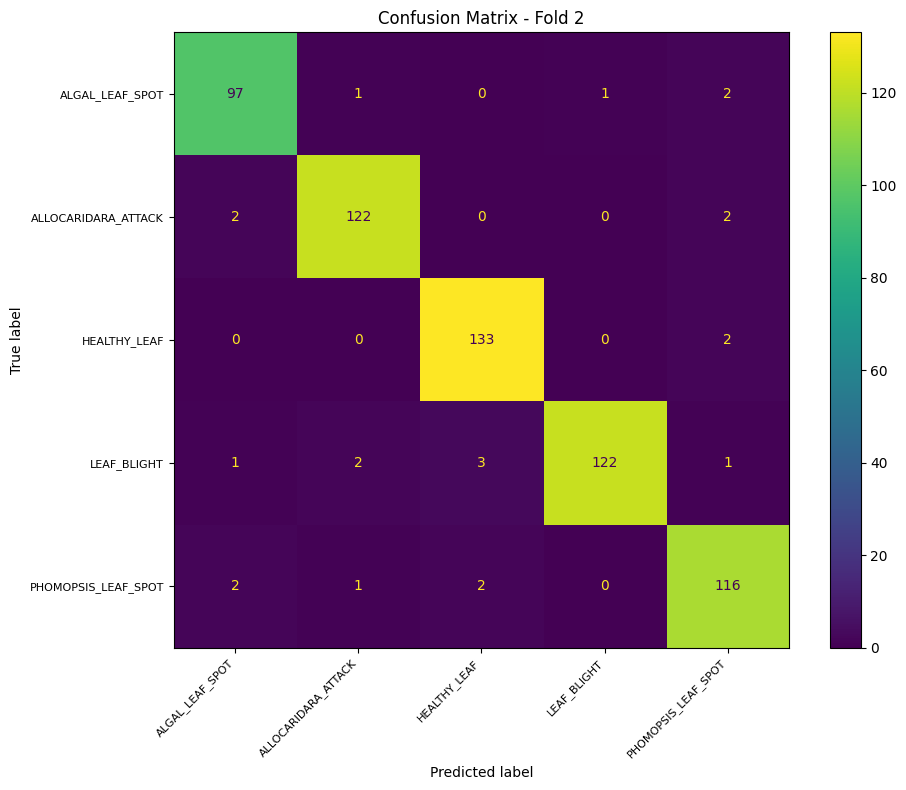

                     precision    recall  f1-score   support

    ALGAL_LEAF_SPOT       0.95      0.96      0.96       101
ALLOCARIDARA_ATTACK       0.97      0.97      0.97       126
       HEALTHY_LEAF       0.96      0.99      0.97       135
        LEAF_BLIGHT       0.99      0.95      0.97       129
PHOMOPSIS_LEAF_SPOT       0.94      0.96      0.95       121

           accuracy                           0.96       612
          macro avg       0.96      0.96      0.96       612
       weighted avg       0.96      0.96      0.96       612

--------------------------------------------------


Evaluating Fold 3:   0%|          | 0/77 [00:00<?, ?it/s]


--- Results for Fold: 3 ---


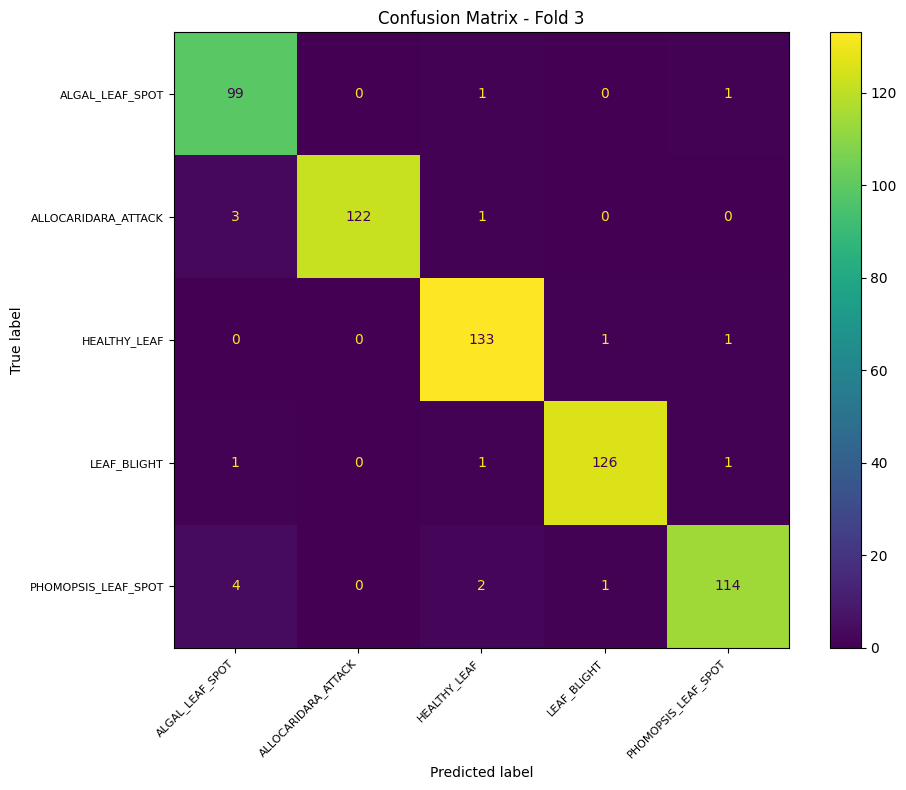

                     precision    recall  f1-score   support

    ALGAL_LEAF_SPOT       0.93      0.98      0.95       101
ALLOCARIDARA_ATTACK       1.00      0.97      0.98       126
       HEALTHY_LEAF       0.96      0.99      0.97       135
        LEAF_BLIGHT       0.98      0.98      0.98       129
PHOMOPSIS_LEAF_SPOT       0.97      0.94      0.96       121

           accuracy                           0.97       612
          macro avg       0.97      0.97      0.97       612
       weighted avg       0.97      0.97      0.97       612

--------------------------------------------------


Evaluating Fold 4:   0%|          | 0/77 [00:00<?, ?it/s]


--- Results for Fold: 4 ---


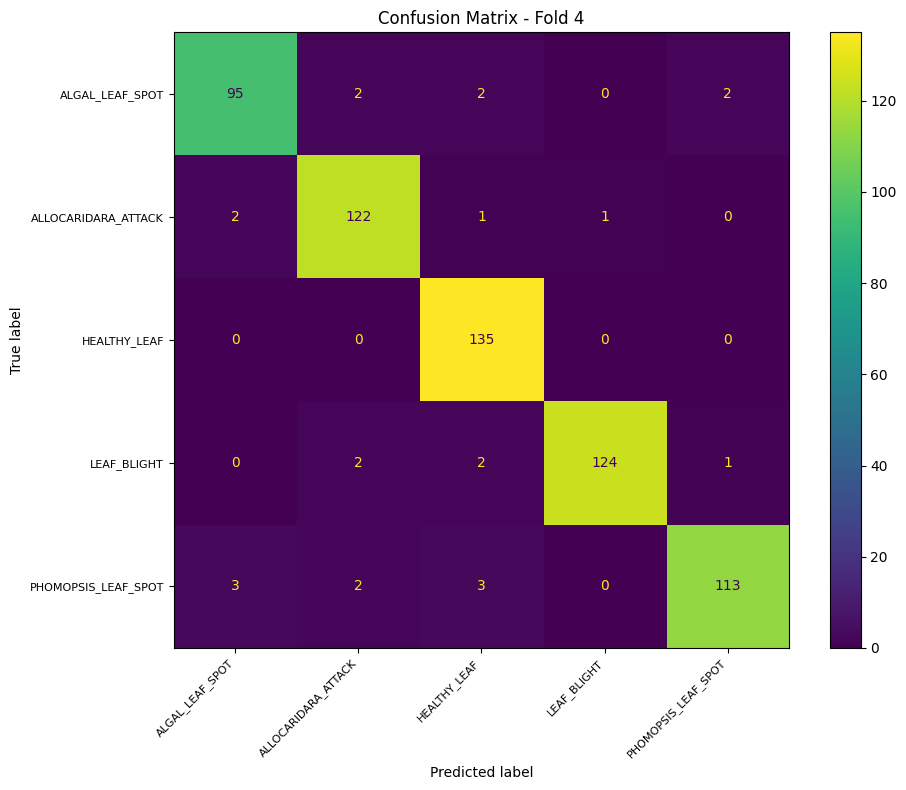

                     precision    recall  f1-score   support

    ALGAL_LEAF_SPOT       0.95      0.94      0.95       101
ALLOCARIDARA_ATTACK       0.95      0.97      0.96       126
       HEALTHY_LEAF       0.94      1.00      0.97       135
        LEAF_BLIGHT       0.99      0.96      0.98       129
PHOMOPSIS_LEAF_SPOT       0.97      0.93      0.95       121

           accuracy                           0.96       612
          macro avg       0.96      0.96      0.96       612
       weighted avg       0.96      0.96      0.96       612

--------------------------------------------------


In [26]:
for fold in range(k_splits):
    predictions = []
    references = []

    loaded_model = torch.load(f"res2net50_checkpoint_fold{fold}.pt", weights_only=False)
    loaded_model.eval()
    with torch.no_grad():
        for batch in tqdm(test_dataloader, desc=f"Evaluating Fold {fold}"):
            inputs, targets = batch
            outputs = loaded_model(inputs.to(device))

            predictions += outputs.argmax(-1).detach().cpu().tolist()
            references += targets.tolist()

    print(f"\n--- Results for Fold: {fold} ---")

    cm = confusion_matrix(references, predictions)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classname)

    fig, ax = plt.subplots(figsize=(10, 8))
    disp.plot(ax=ax)

    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=8)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=8)

    plt.title(f"Confusion Matrix - Fold {fold}")
    plt.tight_layout()
    plt.show()

    print(classification_report(references, predictions, target_names=classname))
    print("-" * 50) #

## Visualization train model result

In [27]:
## Making Pridcition return class & prob
from typing import List, Tuple

from PIL import Image
def pred_class(model: torch.nn.Module,
                        image_path: str,
                        class_names: List[str],
                        image_size: Tuple[int, int] = (224, 224),
                        transform: T = None,
                        device: torch.device=device):


    # 2. Open image
    img = Image.open(image_path)

    # 3. Create transformation for image (if one doesn't exist)
    if transform is not None:
        image_transform = transform
    else:
        image_transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]),
        ])

    ### Predict on image ###

    # 4. Make sure the model is on the target device
    model.to(device)

    # 5. Turn on model evaluation mode and inference mode
    model.eval()
    with torch.inference_mode():
      # 6. Transform and add an extra dimension to image (model requires samples in [batch_size, color_channels, height, width])
      transformed_image = image_transform(img).unsqueeze(dim=0)

      # 7. Make a prediction on image with an extra dimension and send it to the target device
      target_image_pred = model(transformed_image.to(device))

    # 8. Convert logits -> prediction probabilities (using torch.softmax() for multi-class classification)
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)

    # 9. Convert prediction probabilities -> prediction labels
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)

    classname =  class_names[target_image_pred_label]
    prob = target_image_pred_probs.max().cpu().numpy()

    return classname , prob

In [28]:
##Load some model
loaded_model = torch.load('res2net50_checkpoint_fold1.pt', weights_only=False)

## Train data visulization

In [29]:
#Making df for rando
import os
import pandas as pd
from PIL import Image

# create an empty list to store image paths
image_paths = []

# loop through each subfolder in the "Image" directory
for root, dirs, files in os.walk("./../../data/test/"):
    for subfolder_name in dirs:
        # get the path to the subfolder
        subfolder_path = os.path.join(root, subfolder_name)
        # loop through each file in the subfolder
        for filename in os.listdir(subfolder_path):
            image_path = os.path.join(subfolder_path, filename)
            image_paths.append((image_path, subfolder_name))

# create a DataFrame from the list of image paths
df = pd.DataFrame(image_paths, columns=['path', 'subfolder_name'])


In [30]:
df.sample(10)

,path,subfolder_name
115,./../../data/test/ALLOCARIDARA_ATTACK\to_label...,ALLOCARIDARA_ATTACK
247,./../../data/test/HEALTHY_LEAF\to_label_1845.jpg,HEALTHY_LEAF
522,./../../data/test/PHOMOPSIS_LEAF_SPOT\to_label...,PHOMOPSIS_LEAF_SPOT
170,./../../data/test/ALLOCARIDARA_ATTACK\to_label...,ALLOCARIDARA_ATTACK
356,./../../data/test/HEALTHY_LEAF\to_label_2651.jpg,HEALTHY_LEAF
394,./../../data/test/LEAF_BLIGHT\to_label_2876.jpg,LEAF_BLIGHT
581,./../../data/test/PHOMOPSIS_LEAF_SPOT\to_label...,PHOMOPSIS_LEAF_SPOT
177,./../../data/test/ALLOCARIDARA_ATTACK\to_label...,ALLOCARIDARA_ATTACK
519,./../../data/test/PHOMOPSIS_LEAF_SPOT\to_label...,PHOMOPSIS_LEAF_SPOT
265,./../../data/test/HEALTHY_LEAF\to_label_1958.jpg,HEALTHY_LEAF


In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image



def sample_picture(df=df,random_state=None):
    # Sample 20 random rows from the DataFrame
    sample_df = df.sample(20, random_state=random_state).copy()
    sample_df = sample_df.reset_index(drop=True)
    # Define the grid layout for displaying the images
    num_rows = 4
    num_cols = 5
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 12))
    fig.tight_layout(pad=5.0)

    # Iterate over the sampled rows and display the images in the grid
    for i, row in sample_df.iterrows():
        img = Image.open(row['path'])

        # Prediction
        pred_name , prob = pred_class(model=loaded_model,image_path=row['path'],
                   class_names = classname,
                   transform=data_transforms["test"])

        row_idx = i // num_cols
        col_idx = i % num_cols
        axs[row_idx, col_idx].imshow(img)
        axs[row_idx, col_idx].axis('on')
        axs[row_idx, col_idx].set_title(row['subfolder_name'] + ': \nPredict:' + pred_name + '\nProb:'+ str(prob.round(decimals=2)) )

        # prediction


    plt.show()

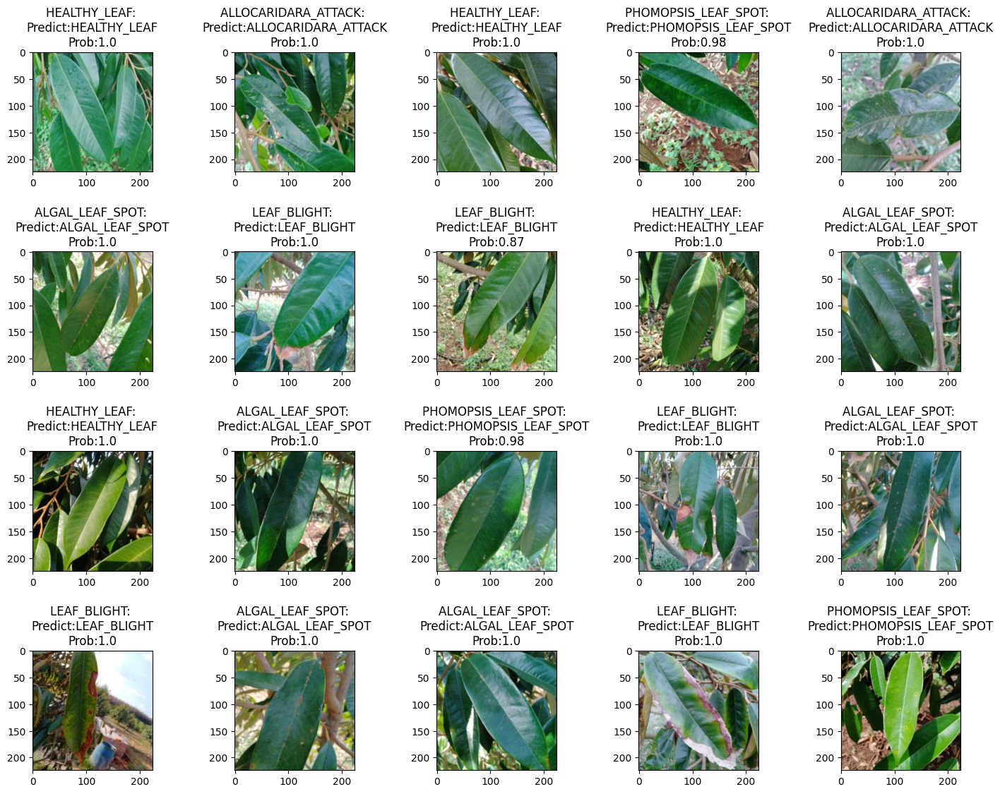

In [32]:
sample_picture()

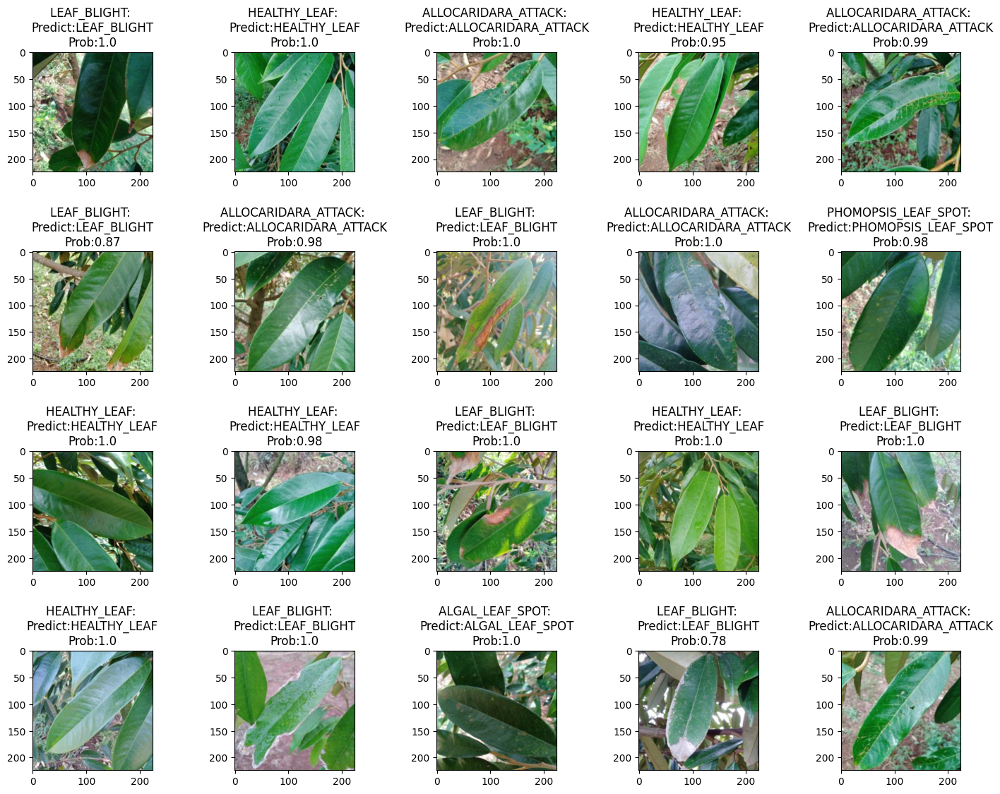

In [33]:
sample_picture()

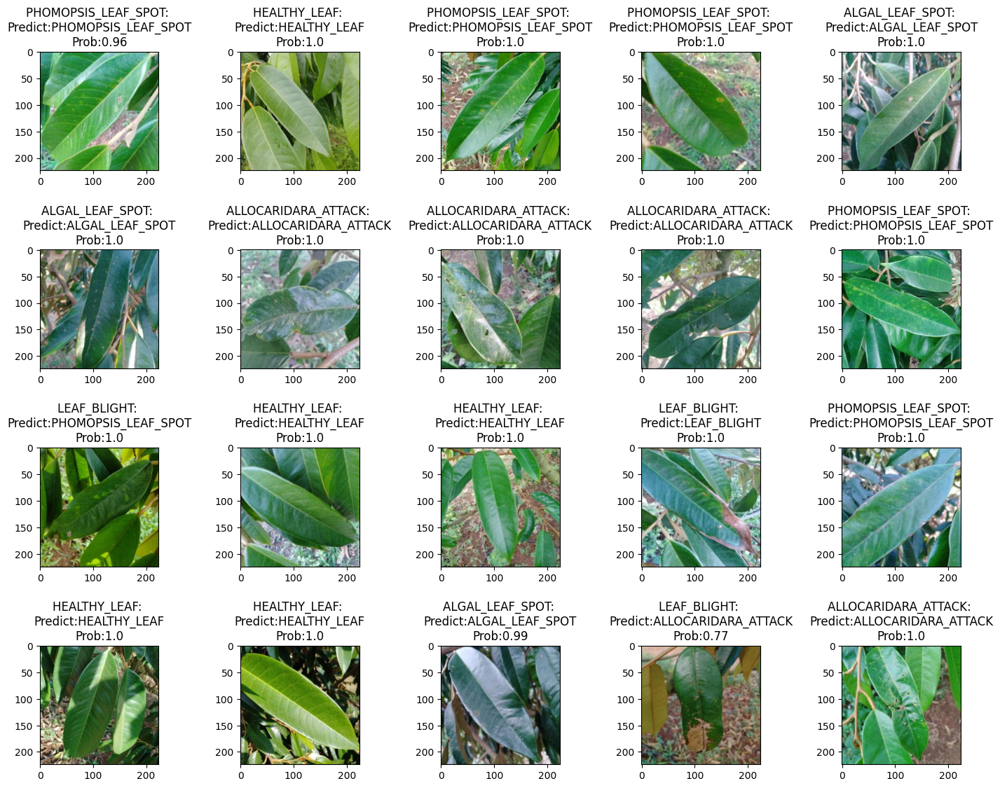

In [34]:
sample_picture()

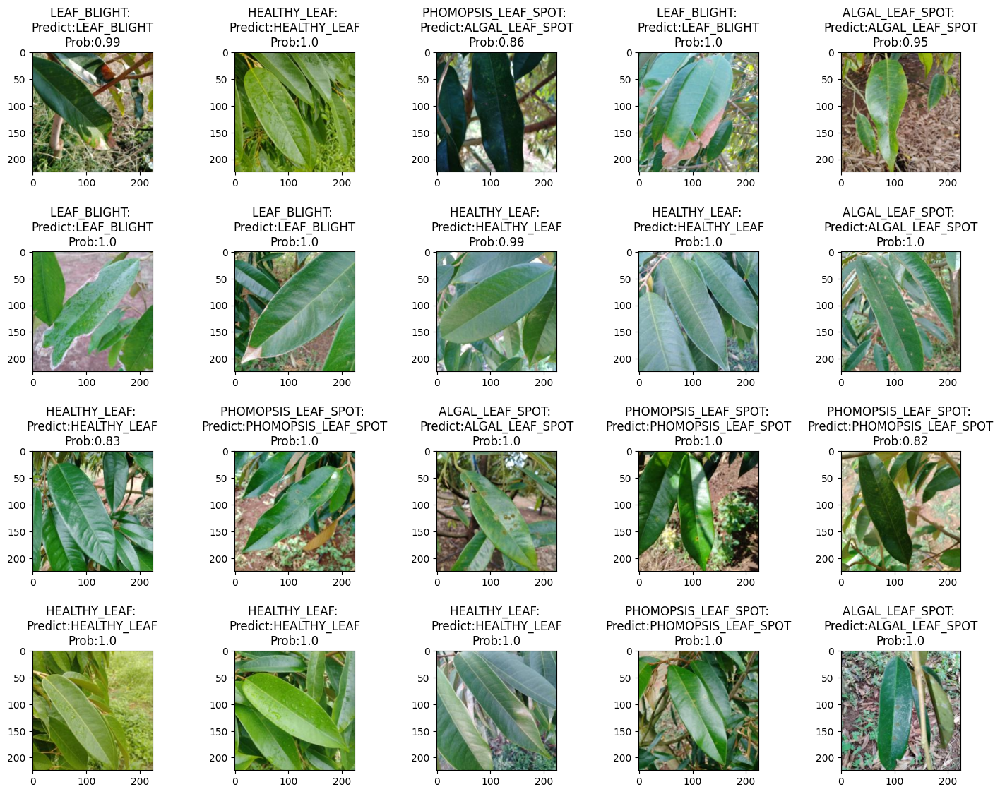

In [35]:
sample_picture()

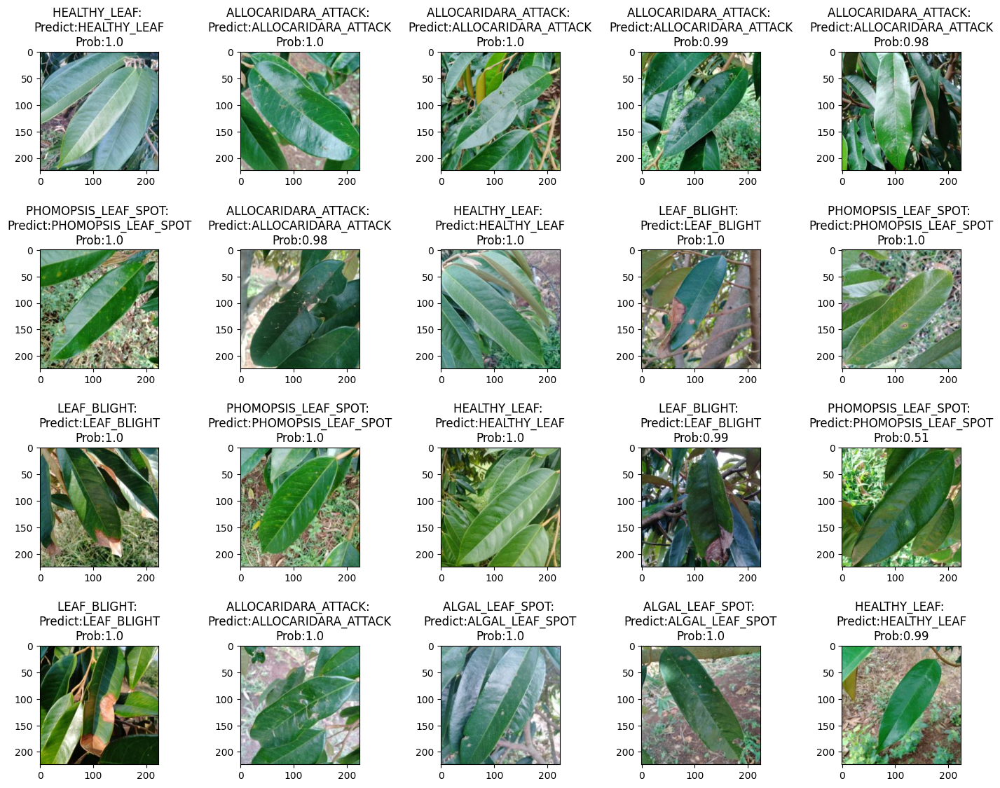

In [36]:
sample_picture()